# CIS520 Final Project
**Team member: Yanbo Feng, Haotong Tian, Stephan Xie**

**Topic: Image Super-resolution with Neural Networks**

Image Super-resolution is a technique that transfers low-resolution image to high-resolution image. Traditionally, super-resolution is implemented by programs that make modification and creations directly on the pixels to increase the detail of the image. In recent years, however, a new line of research focuses on using semi-supervised Machine Learning models (for example Convolutional Neural Networks) to perform this task.

In this project, we plan to implement several methods that applys Machine Learning in image super-resolution, and try to come up with some conclusions of their similarities and differences.

# Part I: Data Preparation
In this first part, we will prepare the data that use to train our models. The data is obtained from a Kaggle project (https://www.kaggle.com/adityachandrasekhar/image-super-resolution). The images are divided into train and validation components, and within each component there are low resolution (sample) and high resolution (target) images.

In [ ]:
# Install kaggle API for Colab to fetch the data
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json


In [ ]:
# Download data from Kaggle
! kaggle datasets download -d adityachandrasekhar/image-super-resolution
! unzip image-super-resolution.zip

 95% 286M/301M [00:02<00:00, 97.3MB/s]
100% 301M/301M [00:02<00:00, 125MB/s] 
Archive:  image-super-resolution.zip
  inflating: dataset/Raw Data/high_res/0.png  
  inflating: dataset/Raw Data/high_res/1.png  
  inflating: dataset/Raw Data/high_res/10.png  
  inflating: dataset/Raw Data/high_res/100.png  
  inflating: dataset/Raw Data/high_res/101.png  
  inflating: dataset/Raw Data/high_res/102.png  
  inflating: dataset/Raw Data/high_res/103.png  
  inflating: dataset/Raw Data/high_res/104.png  
  inflating: dataset/Raw Data/high_res/105.png  
  inflating: dataset/Raw Data/high_res/106.png  
  inflating: dataset/Raw Data/high_res/107.png  
  inflating: dataset/Raw Data/high_res/108.png  
  inflating: dataset/Raw Data/high_res/109.png  
  inflating: dataset/Raw Data/high_res/11.png  
  inflating: dataset/Raw Data/high_res/110.png  
  inflating: dataset/Raw Data/high_res/111.png  
  inflating: dataset/Raw Data/high_res/112.png  
  inflating: dataset/Raw Data/high_res/113.png  
  inflati

In [ ]:
import numpy as np
from numpy import linalg as LA
import os
import re
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras.models import Sequential
import matplotlib.pyplot as plt
from tqdm import tqdm
import PIL
from PIL import Image

import torch
import torchvision
from torchvision import datasets, transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In the following cells, our team sorts the png images in the dataset folder into ascending alphanumerical order and converts the images into pixel-wise RGB-value matrix.

In [ ]:
# Load high resolution images in training set into an array
high_img = []
high_img_gray = []
high_path = '/content/dataset/train/high_res'
high_files = os.listdir(high_path)
high_files.sort(key=lambda f: int(re.sub('\D', '', f)))
for img in tqdm(high_files):
  image = Image.open(high_path+'/'+img)
  image = image.getdata()
  gray = Image.open(high_path+'/'+img).convert('L').getdata()
  high_img_gray.append(gray)
  high_img.append(image)
high_train = np.array(high_img)
high_train_gray = np.array(high_img_gray)

# Load low resolution images in training set into an array
low_img = []
low_img_gray = []
low_path = '/content/dataset/train/low_res'
low_files = os.listdir(low_path)
low_files.sort(key=lambda f: int(re.sub('\D', '', f)))
for img in tqdm(low_files):
  image = Image.open(low_path+'/'+img)
  image = image.getdata()
  gray = Image.open(high_path+'/'+img).convert('L').getdata()
  low_img_gray.append(gray)
  low_img.append(image)
low_train = np.array(low_img)
low_train_gray = np.array(low_img_gray)

# Load high resolution images in validation set into an array
high_img_2 = []
high_img_2_gray = []
high_path_2 = '/content/dataset/val/high_res'
high_files_2 = os.listdir(high_path_2)
high_files_2.sort(key=lambda f: int(re.sub('\D', '', f)))
for img in tqdm(high_files_2):
  image = Image.open(high_path_2+'/'+img)
  image = image.getdata()
  gray = Image.open(high_path+'/'+img).convert('L').getdata()
  high_img_2_gray.append(gray)
  high_img_2.append(image)
high_val = np.array(high_img_2)
high_val_gray = np.array(high_img_2_gray)

# Load low resolution images in validation set into an array
low_img_2 = []
low_img_2_gray = []
low_path_2 = '/content/dataset/val/low_res'
low_files_2 = os.listdir(low_path_2)
low_files_2.sort(key=lambda f: int(re.sub('\D', '', f)))
for img in tqdm(low_files_2):
  image = Image.open(low_path_2+'/'+img)
  image = image.getdata()
  gray = Image.open(high_path+'/'+img).convert('L').getdata()
  low_img_2_gray.append(gray)
  low_img_2.append(image)
low_val = np.array(low_img_2)
low_val_gray = np.array(low_img_2_gray)

100%|██████████| 170/170 [00:01<00:00, 99.03it/s] 


We reshape the above RGB arrays into RGB matrices with the same shape as the images.

In [ ]:
# png image has R,G,B,A, where A is alpha value to indicate transparency, we remove the alpha value
high_train_cp = high_train.copy()
low_train_cp = low_train.copy()
high_val_cp = high_val.copy()
low_val_cp = low_val.copy()

high_train_cp = high_train_cp[:, :, :3].reshape((high_train_cp.shape[0], 256, 256,3)).astype('float32')/255.0
low_train_cp = low_train_cp[:, :, :3].reshape((low_train_cp.shape[0], 256, 256,3)).astype('float32')/255.0
high_val_cp = high_val_cp[:, :, :3].reshape((high_val_cp.shape[0], 256, 256,3)).astype('float32')/255.0
low_val_cp = low_val_cp[:, :, :3].reshape((low_val_cp.shape[0], 256, 256,3)).astype('float32')/255.0

#high_train_gray_cp = high_train_gray.copy()
#low_train_gray_cp = low_train_gray.copy()
#high_val_gray_cp = high_val_gray.copy()
#low_val_gray_cp = low_val_gray.copy()

#high_train_gray_cp = high_train_gray_cp.reshape((high_train_gray_cp.shape[0], 256, 256)).astype('float32')/255.0
#low_train_gray_cp = low_train_gray_cp.reshape((low_train_gray_cp.shape[0], 256, 256)).astype('float32')/255.0
#high_val_gray_cp = high_val_gray_cp.reshape((high_val_gray_cp.shape[0], 256, 256)).astype('float32')/255.0
#low_val_gray_cp = low_val_gray_cp.reshape((low_val_gray_cp.shape[0], 256, 256)).astype('float32')/255.0

#high_train_gray_cp = np.mean(high_train_cp, axis = 3)
#low_train_gray_cp = np.mean(low_train_cp, axis = 3)
#high_val_gray_cp = np.mean(high_val_cp, axis = 3)
#low_val_gray_cp = np.mean(low_val_cp, axis = 3)
#print(high_train_gray_cp)
#print(high_train_cp)

# Part II: Data Visualization
In this section, our team plan to visualize first 10 high-resolution images and low-resolution images in the prepared training data. These images are converted back from high dimensional RGB matrix into PIL images.


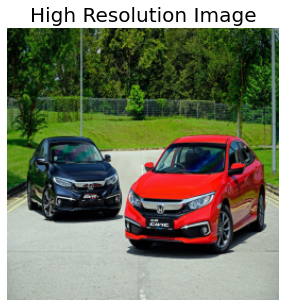

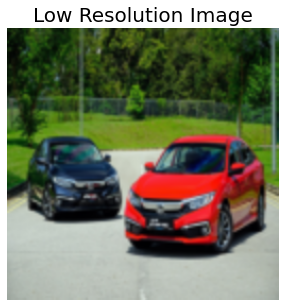

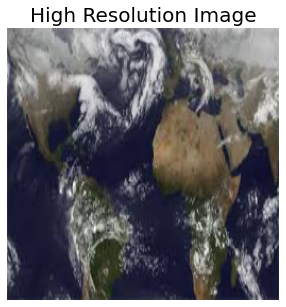

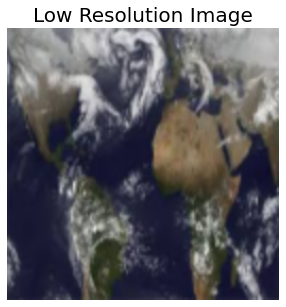

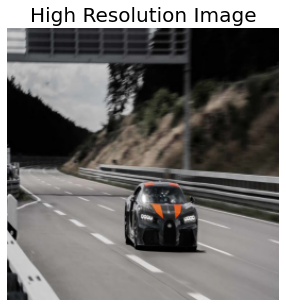

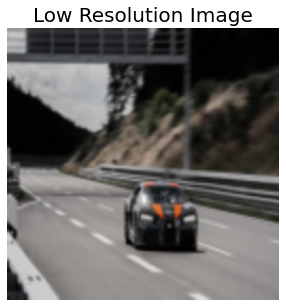

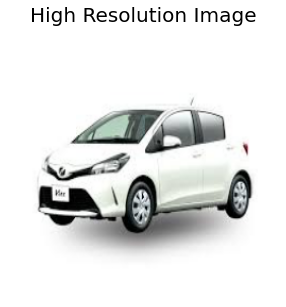

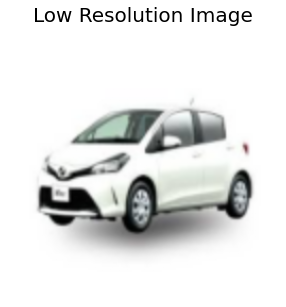

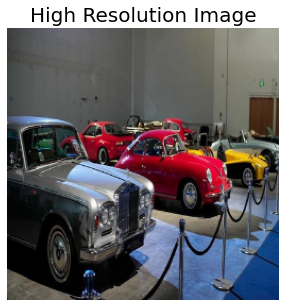

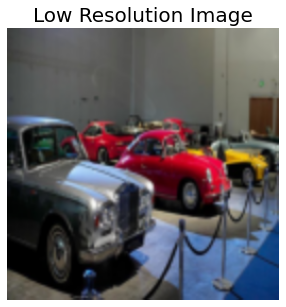

In [ ]:
# visualize some training data
for a in range(5):
  plt.figure(figsize = (5,5))
  plt.title("High Resolution Image", fontsize = 20)
  plt.imshow(high_train_cp[a])
  plt.axis('off')
  plt.figure(figsize = (5,5))
  plt.title("Low Resolution Image", fontsize = 20)
  plt.imshow(low_train_cp[a])
  plt.axis('off')

# Part III: Model Building

## PSNR - Peak Signal-to-noise Ratio
Here we define a method to calculate the PSNR metric. 

In [ ]:
from keras import backend as K
def PSNR(y_true, y_pred):
    mse= np.mean((y_true-y_pred)**2)
    if mse == 0:
      return 100
    max_pixel = 1.0
    psnr = 20*np.log10(max_pixel/np.sqrt(mse))
    return psnr

# Must use keras backend functions to use as metric
def PSNR_keras(y_true, y_pred):
    max_pixel = 1.0
    return (10.0 * K.log((max_pixel ** 2) / (K.mean(K.square(y_pred - y_true), axis=-1)))) / 2.303

# 1. Baseline CNN

In [ ]:
def conv_layer(num_filter, kernel_size):
  model = keras.models.Sequential()
  model.add(layers.Conv2D(num_filter, kernel_size, strides = 2, padding = 'same'))
  model.add(layers.ReLU())
  return model

def transpose_layer(num_filter, kernel_size):
  model = keras.models.Sequential()
  model.add(layers.Conv2DTranspose(num_filter, kernel_size, strides = 2, padding = 'same'))
  model.add(layers.ReLU())
  return model

In [ ]:
inputs = layers.Input(shape = (256, 256, 3))
l1 = conv_layer(32, (2,2))(inputs)
l2 = conv_layer(64, (2,2))(l1)
l3 = conv_layer(128, (2,2))(l2)
l4 = conv_layer(256, (2,2))(l3)
l5 = conv_layer(512, (2,2))(l4)
l6 = transpose_layer(512, (2,2))(l5)
l7 = transpose_layer(256, (2,2))(l6)
l8 = transpose_layer(128, (2,2))(l7)
l9 = transpose_layer(64, (2,2))(l8)
l10 = transpose_layer(32, (2,2))(l9)
outputs = layers.Conv2D(3, (2,2), padding='same')(l10)

Baseline = models.Model(inputs=inputs, outputs=outputs)
Baseline.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3), loss='mse',metrics=[PSNR_keras, 'accuracy'])
Baseline.summary()
history_2 = Baseline.fit(low_train_cp, high_train_cp, batch_size=1, epochs=8)


Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 sequential_68 (Sequential)  (None, 128, 128, 32)      416       
                                                                 
 sequential_69 (Sequential)  (None, 64, 64, 64)        8256      
                                                                 
 sequential_70 (Sequential)  (None, 32, 32, 128)       32896     
                                                                 
 sequential_71 (Sequential)  (None, 16, 16, 256)       131328    
                                                                 
 sequential_72 (Sequential)  (None, 8, 8, 512)         524800    
                                                                 
 sequential_73 (Sequential)  (None, 16, 16, 512)       1049

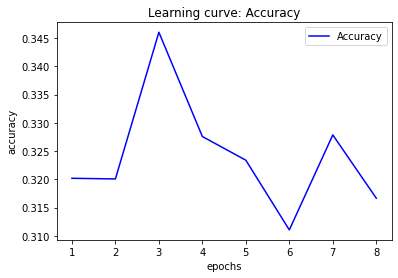

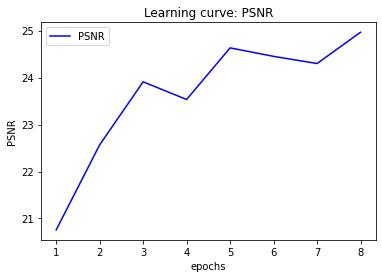

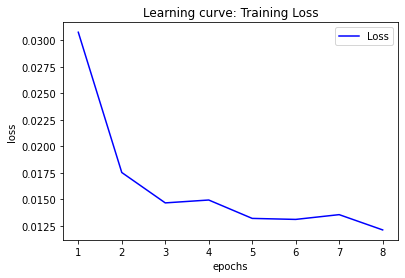

In [ ]:
epochs = np.arange(1, 9, 1)
plt.plot(epochs, train_history_2.get('accuracy'), color='b', label='Accuracy')
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.title("Learning curve: Accuracy")
plt.legend()
plt.show()


plt.plot(epochs, train_history_2.get('PSNR'), color='b', label='PSNR')
plt.xlabel("epochs")
plt.ylabel("PSNR")
plt.title("Learning curve: PSNR")
plt.legend()
plt.show()

plt.plot(epochs, train_history_2.get('loss'), color='b', label='Loss')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title("Learning curve: Training Loss")
plt.legend()
plt.show()

In [ ]:
train_history_2 = history_2.history

In [ ]:
keras.utils.plot_model(Baseline, "multi_input_and_output_model.png", show_shapes=True)

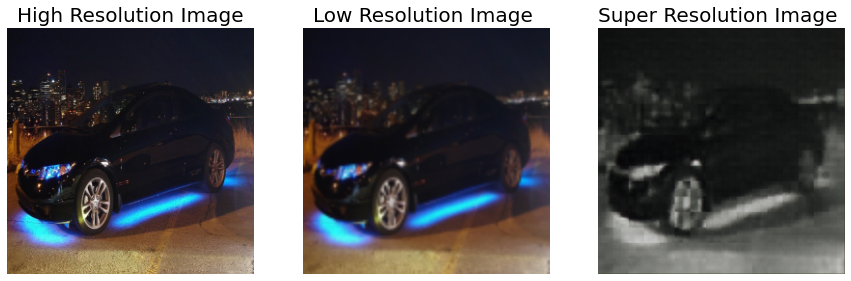

PSNR between SR image and HR image:
19.953830271260603
PSNR between LR image and HR image:
28.80791773481323


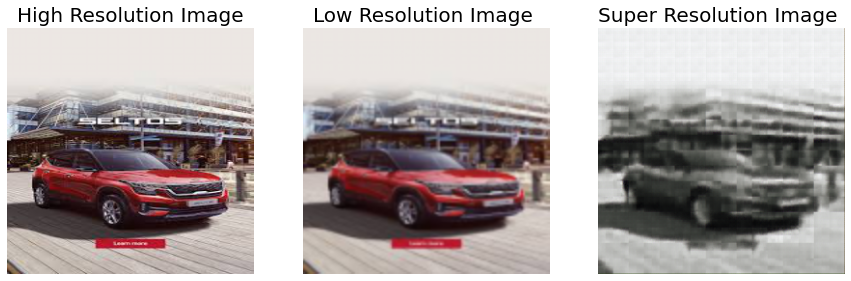

PSNR between SR image and HR image:
20.109063699351438
PSNR between LR image and HR image:
25.41032346276324


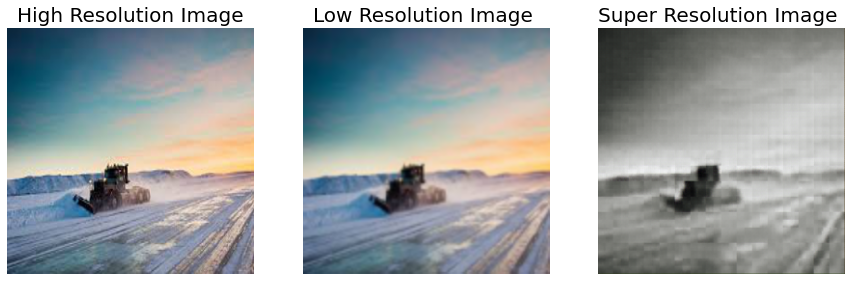

PSNR between SR image and HR image:
21.040449676973736
PSNR between LR image and HR image:
32.84006688974565


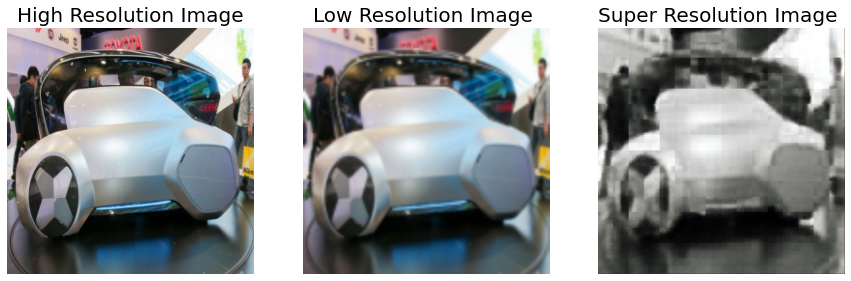

PSNR between SR image and HR image:
20.71465193324272
PSNR between LR image and HR image:
27.166631311673676


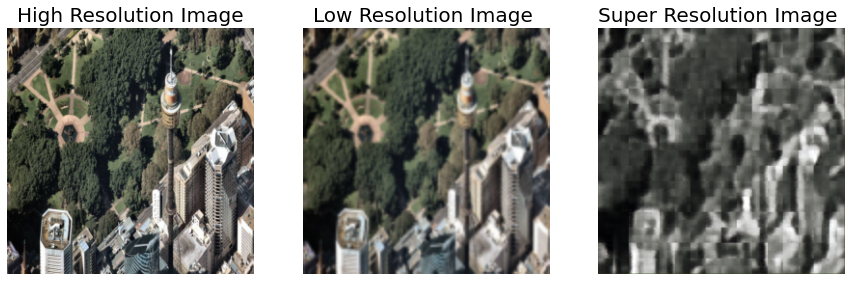

PSNR between SR image and HR image:
20.06903242430379
PSNR between LR image and HR image:
24.23546430816623


In [ ]:
for i in range(5):
  predicted = np.clip(Baseline.predict(low_val_cp[i].reshape(1,256, 256,3)),0.0,1.0)[0]
  plt.figure(figsize=(15,15))
  plt.subplot(1,3,1)
  plt.title('High Resolution Image', fontsize = 20)
  plt.imshow(high_val_cp[i])
  plt.axis('off')
  plt.subplot(1,3,2)
  plt.title('Low Resolution Image ', fontsize = 20)
  plt.imshow(low_val_cp[i])
  plt.axis('off')
  plt.subplot(1,3,3)
  plt.title('Super Resolution Image ', fontsize = 20)
  plt.imshow(predicted)
  plt.axis('off')
  plt.show()
  print("PSNR between SR image and HR image:")
  print(PSNR(high_val_cp[i],predicted))
  print("PSNR between LR image and HR image:")
  print(PSNR(high_val_cp[i],low_val_cp[i]))

PSNR between SR image and HR image:
20.340964117296746
PSNR between LR image and HR image:
26.059218064580225
PSNR between SR image and HR image:
22.117826671335813
PSNR between LR image and HR image:
28.17540784626165
PSNR between SR image and HR image:
19.72831731712138
PSNR between LR image and HR image:
25.01167535511292
PSNR between SR image and HR image:
21.026951240002155
PSNR between LR image and HR image:
27.146914148793403
PSNR between SR image and HR image:
10.76263947335323
PSNR between LR image and HR image:
27.5044026868514
Average PSNR over test set (170 images): 20.07876712802695


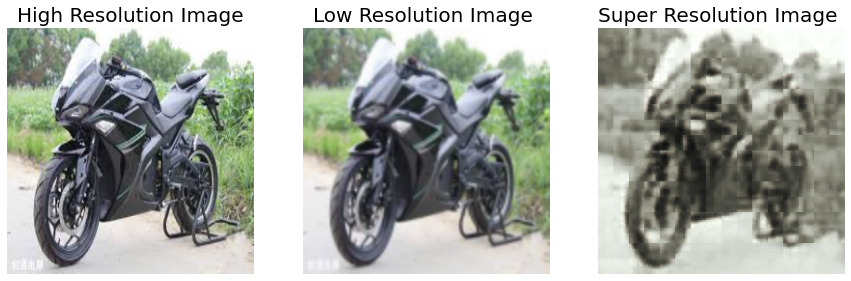

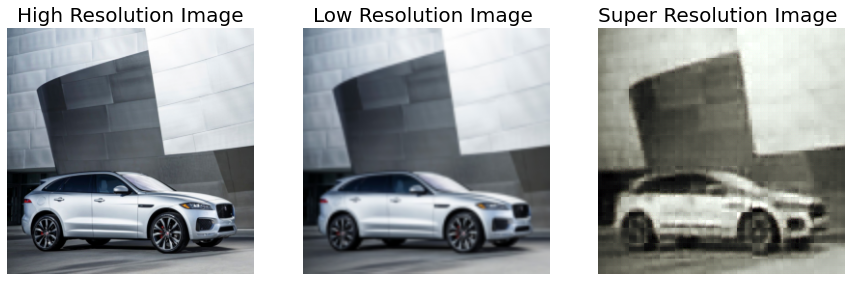

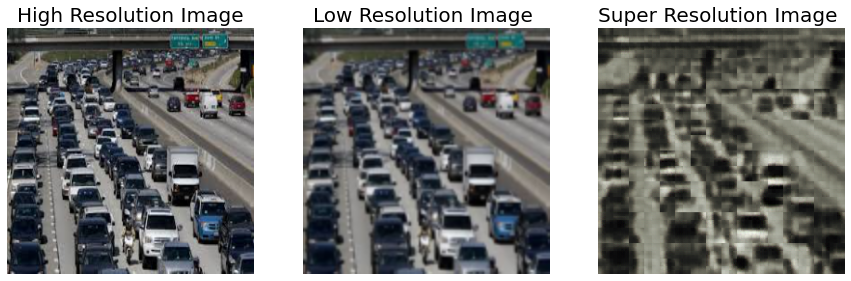

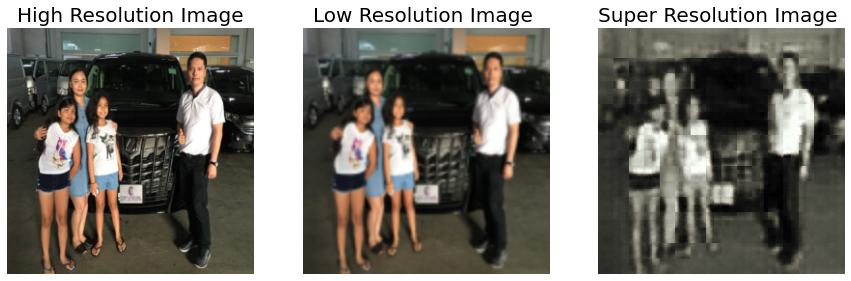

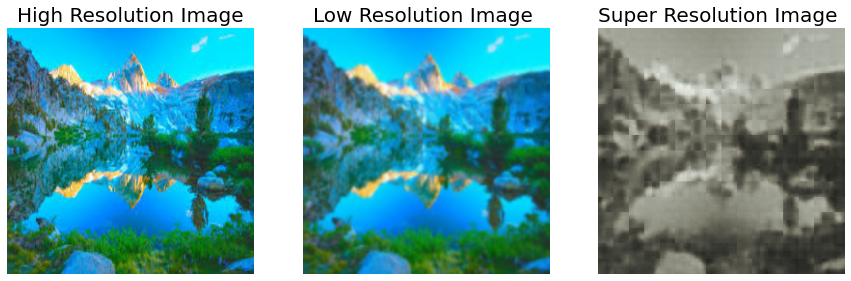

In [ ]:
# This code runs a PyTorch version of the same model (on a previous version of our notebook), and calculates the PSNR
PSNR_sum = 0
with torch.no_grad():
    for i, data in enumerate(valloader):
        images, labels = data
        outputs = baseline_CNN(images.cuda())
        predicted = np.clip(np.moveaxis(outputs.cpu().numpy(), 1, -1) ,0.0,1.0)[0]
        if i > 100 and i < 106:
            plt.figure(figsize=(15,15))
            plt.subplot(1,3,1)
            plt.title('High Resolution Image', fontsize = 20)
            plt.imshow(high_val_cp[i])
            plt.axis('off')
            plt.subplot(1,3,2)
            plt.title('Low Resolution Image ', fontsize = 20)
            plt.imshow(low_val_cp[i])
            plt.axis('off')
            plt.subplot(1,3,3)
            plt.title('Super Resolution Image ', fontsize = 20)
            plt.imshow(predicted)
            plt.axis('off')
            print("PSNR between SR image and HR image:")
            print(PSNR(high_val_cp[i],predicted))
            print("PSNR between LR image and HR image:")
            print(PSNR(high_val_cp[i],low_val_cp[i]))
        PSNR_sum += PSNR(high_val_cp[i],predicted)
print(f'Average PSNR over test set (170 images): {PSNR_sum / 170}')
plt.show()

# 2. Residual CNN (UNet)

In [ ]:
# Define contracting pathway and expanding pathway
def contract(num_filter, kernel_size, batch_norm = False):
  model = keras.models.Sequential()
  model.add(layers.Conv2D(num_filter, kernel_size, strides=2, padding='same'))
  if batch_norm == True:
    model.add(layers.BatchNormalization())
  model.add(layers.LeakyReLU())
  return model
def expand(num_filter, kernel_size, dropout = False):
  model = keras.models.Sequential()
  model.add(layers.Conv2DTranspose(num_filter, kernel_size, strides=2, padding='same'))
  if dropout == True:
      model.add(layers.Dropout(0.3))
  model.add(layers.LeakyReLU())
  return model

In [ ]:
# UNN architecture buildup
inputs= layers.Input(shape = (256,256, 3))
c1 = contract(64, (3,3))(inputs)
c1_r = contract(64, (3,3))(c1)
c2 = contract(128, (3,3))(c1_r)
c2_r = contract(128, (3,3))(c2)
c3 = contract(256, (3,3), True)(c2_r)
c3_r = contract(256, (3,3), True)(c3)
c4 = contract(512, (3,3), True)(c3_r)
c4_r = contract(512, (3,3), True)(c3_r)
c5 = contract(512, (3,3), True)(c4)

e1 = expand(512, (3,3), True)(c5)
e2 = expand(512, (3,3), True)(e1)
e2 = layers.concatenate([e2, c3_r])
e3 = expand(256, (3,3), True)(e2)
e4 = expand(256, (3,3), True)(e3)
e4 = layers.concatenate([e4, c2_r])
e5 = expand(128, (3,3), True)(e4)
e6 = expand(128, (3,3), True)(e5)
e6 = layers.concatenate([e6, c1_r])
e7 = expand(64, (3,3), True)(e6)
e7 = layers.concatenate([e7, c1])
e8 = expand(3, (3,3), True)(e7)
e8 = layers.concatenate([e8, inputs])
outputs = layers.Conv2D(3, (1,1), padding='same')(e8)

ResNet = models.Model(inputs=inputs, outputs=outputs)
ResNet.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3), loss='mse',metrics=[PSNR_keras, 'accuracy'])
ResNet.summary()
history = ResNet.fit(low_train_cp, high_train_cp, batch_size=1, epochs=8)

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential_51 (Sequential)     (None, 128, 128, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_52 (Sequential)     (None, 64, 64, 64)   36928       ['sequential_51[0][0]']          
                                                                                            

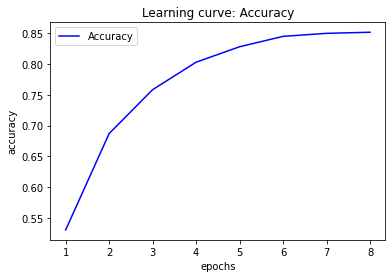

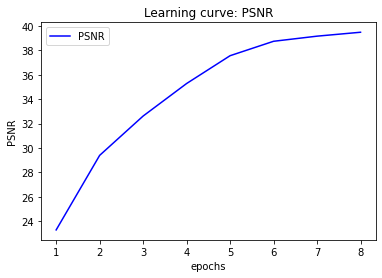

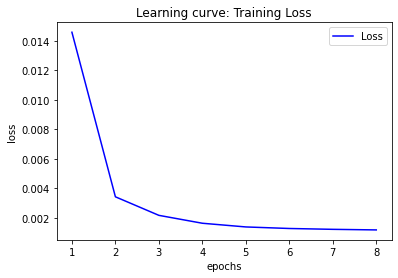

In [ ]:
train_history = history.history
import matplotlib.pyplot as plt

epochs = np.arange(1, 9, 1)
plt.plot(epochs, train_history.get('accuracy'), color='b', label='Accuracy')
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.title("Learning curve: Accuracy")
plt.legend()
plt.show()

plt.plot(epochs, train_history.get('PSNR_keras'), color='b', label='PSNR')
plt.xlabel("epochs")
plt.ylabel("PSNR")
plt.title("Learning curve: PSNR")
plt.legend()
plt.show()


plt.plot(epochs, train_history.get('loss'), color='b', label='Loss')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title("Learning curve: Training Loss")
plt.legend()
plt.show()

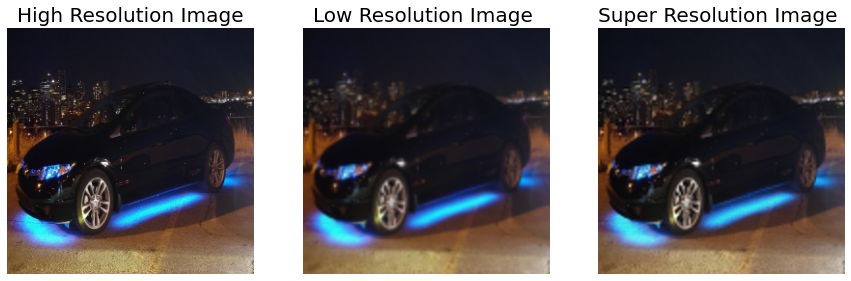

PSNR between SR image and HR image:
29.28742995414901
PSNR between LR image and HR image:
28.80791773481323


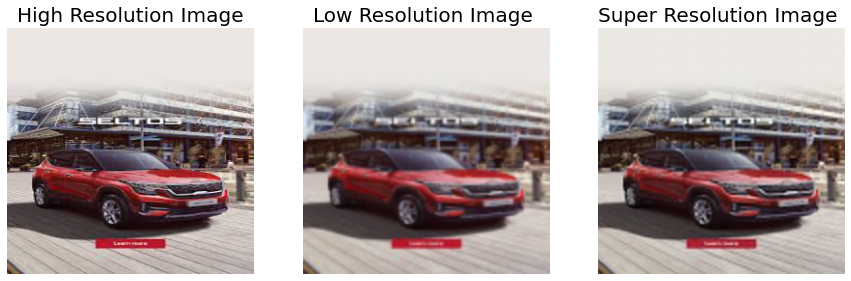

PSNR between SR image and HR image:
26.53463825974759
PSNR between LR image and HR image:
25.41032346276324


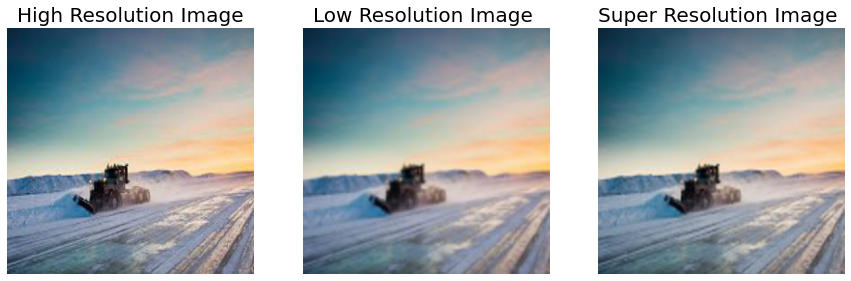

PSNR between SR image and HR image:
33.7385124803793
PSNR between LR image and HR image:
32.84006688974565


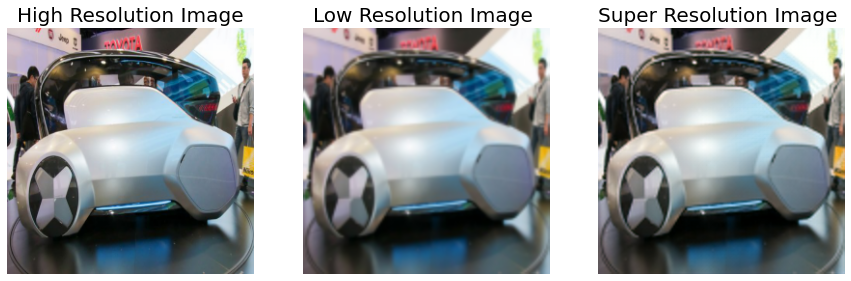

PSNR between SR image and HR image:
28.896147152980113
PSNR between LR image and HR image:
27.166631311673676


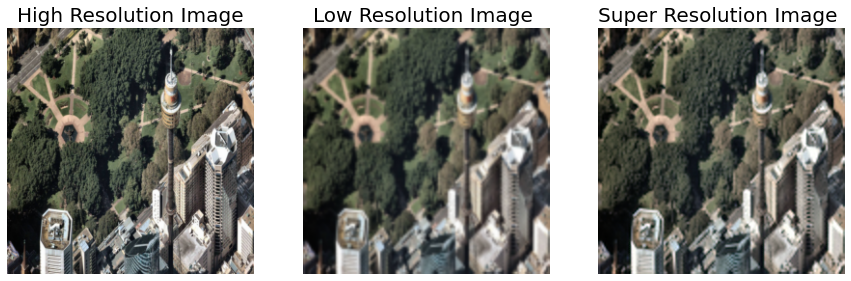

PSNR between SR image and HR image:
26.073510389458903
PSNR between LR image and HR image:
24.23546430816623


In [ ]:
# visualize the super-resolution image along with the high resolution image and low resolution image
PSNR_sum = 0
for i in range(low_val_cp):
  predicted = np.clip(ResNet.predict(low_val_cp[i].reshape(1,256, 256,3)),0.0,1.0).reshape(256, 256,3)
  if i < 5:
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('High Resolution Image', fontsize = 20)
    plt.imshow(high_val_cp[i])
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.title('Low Resolution Image ', fontsize = 20)
    plt.imshow(low_val_cp[i])
    plt.axis('off')
    plt.subplot(1,3,3)
    plt.title('Super Resolution Image ', fontsize = 20)
    plt.imshow(predicted)
    plt.axis('off')
    plt.show()
  PSNR_sum += PSNR(predicted, high_val_cp[i]) 
  print("PSNR between SR image and HR image:")
  print(PSNR(high_val_cp[i],predicted))
  print("PSNR between LR image and HR image:")
  print(PSNR(high_val_cp[i],low_val_cp[i]))
print(f'Average PSNR for test set (170): {PSNR_sum / 170}')

# 4. Deep Recursive Residual Neural Network (DRRN_B1U20) Implementation
Based on the paper https://openaccess.thecvf.com/content_cvpr_2017/papers/Tai_Image_Super-Resolution_via_CVPR_2017_paper.pdf
and adapted from https://github.com/jt827859032/DRRN-pytorch \\
1 Recursive Block \\
20 units per block

In [ ]:
"""
Load data into Torch
"""
from torch.utils.data import TensorDataset, DataLoader


print(low_train_cp.shape)
low_train_cp_tensor = torch.Tensor(np.moveaxis(low_train_cp, -1, 1))
print(np.moveaxis(low_train_cp, -1, 1).shape)
high_train_cp_tensor = torch.Tensor(np.moveaxis(high_train_cp, -1, 1))
low_val_cp_tensor = torch.Tensor(np.moveaxis(low_val_cp, -1, 1))
high_val_cp_tensor = torch.Tensor(np.moveaxis(high_val_cp, -1, 1))

trainset = TensorDataset(low_train_cp_tensor, high_train_cp_tensor)
trainloader = DataLoader(trainset)
valset = TensorDataset(low_val_cp_tensor, high_val_cp_tensor)
valloader = DataLoader(valset)

(685, 256, 256, 3)
(685, 3, 256, 256)


In [ ]:
def PSNR(mse):
    if mse == 0:
      return 100
    max_pixel = 1.0
    psnr = 20*np.log10(max_pixel/np.sqrt(mse))
    return psnr

In [ ]:
class DRRN(nn.Module):
    def __init__(self):
        super(DRRN, self).__init__()
        self.in_layer = nn.Conv2d(in_channels=3, out_channels=128, kernel_size=3, stride=1, padding=1, bias=False)
        self.conv1 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1, bias=False)
        self.conv2 = nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1, bias=False)
        self.out_layer = nn.Conv2d(in_channels=128, out_channels=3, kernel_size=3, stride=1, padding=1, bias=False)
        self.relu = nn.ReLU(inplace=True)

		# weights initialization
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                n = m.kernel_size[0] * m.kernel_size[1] * m.out_channels
                m.weight.data.normal_(0, np.sqrt(2. / n))

    def forward(self, x):
        # Apply first layer
        inputs = self.in_layer(self.relu(x))
        rec = inputs
        # 20 units in recursive block
        for i in range(20):
            rec = self.relu(rec)
            rec = self.conv1(rec)
            rec = self.relu(rec)
            rec = self.conv2(rec)
            rec = torch.add(rec, inputs)
        # Apply final layer
        rec = self.relu(rec)
        rec = self.out_layer(rec)
        rec = torch.add(rec, x)
        return rec

In [ ]:
drrn = DRRN().cuda()
objective = nn.MSELoss()
optimizer = optim.SGD(drrn.parameters(), lr=0.1, momentum=0.9)

loss_per_100 = []
PSNR_per_100 = []

for epoch in range(3):
    running_loss = 0
    running_psnr = 0
    # LR update
    lr = 0.1 * (0.5 ** (epoch // 5))
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr
    
    for i, data in enumerate(trainloader):
        input, label = data
        input, label = input.cuda(), label.cuda()
        output = drrn(input)
        loss = objective(output, label)

        optimizer.zero_grad()
        loss.backward()

        # gradient clipping
        clip = 0.01 / lr
        nn.utils.clip_grad_norm(drrn.parameters(), clip)
        optimizer.step()
        
        loss_out = loss.item()
        running_loss += loss_out
        running_psnr += PSNR(loss_out)
        if i % 100 == 0:
            print(f'epoch: {epoch} step: {i+1} loss: {running_loss / (i+1)} PSNR: {running_psnr / (i+1)}')
            loss_per_100.append(running_loss / (i+1))
            PSNR_per_100.append(running_psnr / (i+1))


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: UserWarning: torch.nn.utils.clip_grad_norm is now deprecated in favor of torch.nn.utils.clip_grad_norm_.


epoch: 0 step: 1 loss: 641.4013671875 PSNR: -28.071298813195096
epoch: 0 step: 101 loss: 6.879534831627313 PSNR: 20.05044995508023
epoch: 0 step: 201 loss: 3.4579792798834736 PSNR: 23.63102000334403
epoch: 0 step: 301 loss: 2.3096121414453354 PSNR: 25.713123093113577
epoch: 0 step: 401 loss: 1.7339472985765503 PSNR: 26.95428161668252
epoch: 0 step: 501 loss: 1.3880423419777908 PSNR: 27.799407984601384
epoch: 0 step: 601 loss: 1.1572660876225567 PSNR: 28.341029254071934
epoch: 1 step: 1 loss: 0.002209726255387068 PSNR: 26.55661524115083
epoch: 1 step: 101 loss: 0.0009967991905021805 PSNR: 30.829116868211795
epoch: 1 step: 201 loss: 0.0010231399006732688 PSNR: 30.751712734073656
epoch: 1 step: 301 loss: 0.0010482097901313016 PSNR: 30.907901199774237
epoch: 1 step: 401 loss: 0.0010656057469954103 PSNR: 30.927194940389814
epoch: 1 step: 501 loss: 0.0010268937594573545 PSNR: 31.075343448500536
epoch: 1 step: 601 loss: 0.0010234701629741542 PSNR: 31.130474773397435
epoch: 2 step: 1 loss: 0.0

KeyboardInterrupt: ignored

In [ ]:
loss_per_epoch = []
PSNR_per_epoch = []
for epoch in range(3):
    loss_sum = 0
    PSNR_sum = 0
    for i in range(7):
        loss_sum += loss_per_100[epoch * 7 + i]
        PSNR_sum += PSNR_per_100[epoch * 7 + i]
    loss_per_epoch.append(loss_sum / 7)
    PSNR_per_epoch.append(PSNR_sum / 7)

## Testing for DRRN: Average PSNR over the test set

PSNR between SR image and HR image:
29.356853077565226
PSNR between LR image and HR image:
26.059218064580225
PSNR between SR image and HR image:
31.336117967015625
PSNR between LR image and HR image:
28.17540784626165
PSNR between SR image and HR image:
28.038316047236975
PSNR between LR image and HR image:
25.01167535511292
PSNR between SR image and HR image:
29.95053017186131
PSNR between LR image and HR image:
27.146914148793403
PSNR between SR image and HR image:
29.354119769331312
PSNR between LR image and HR image:
27.5044026868514
Average PSNR over validation set (170 images): 31.19388692425578


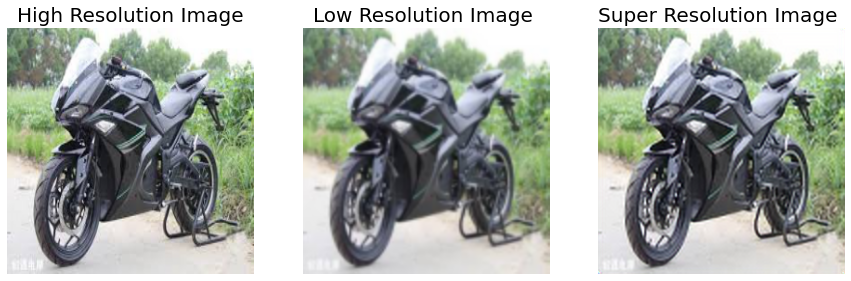

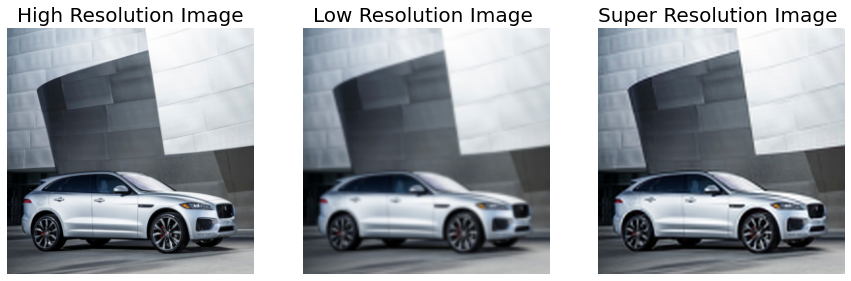

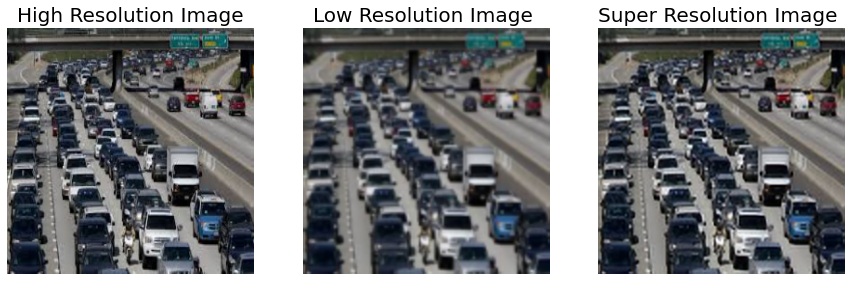

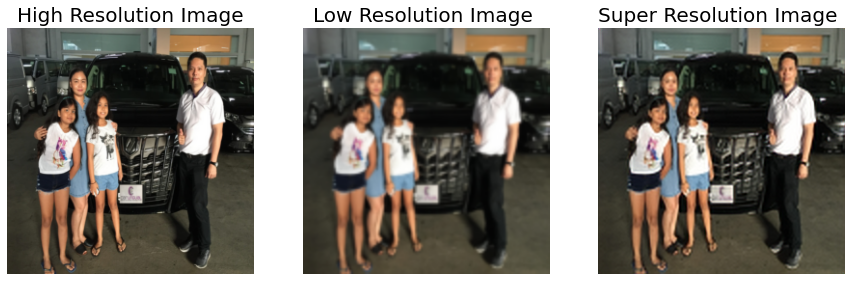

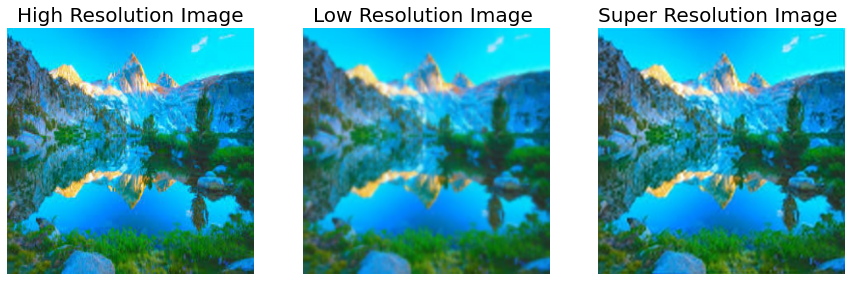

In [ ]:
PSNR_sum = 0
with torch.no_grad():
    for i, data in enumerate(valloader):
        images, labels = data
        outputs = drrn(images.cuda())
        predicted = np.clip(np.moveaxis(outputs.cpu().numpy(), 1, -1) ,0.0,1.0)[0]
        if i > 100 and i < 106:
            plt.figure(figsize=(15,15))
            plt.subplot(1,3,1)
            plt.title('High Resolution Image', fontsize = 20)
            plt.imshow(high_val_cp[i])
            plt.axis('off')
            plt.subplot(1,3,2)
            plt.title('Low Resolution Image ', fontsize = 20)
            plt.imshow(low_val_cp[i])
            plt.axis('off')
            plt.subplot(1,3,3)
            plt.title('Super Resolution Image ', fontsize = 20)
            plt.imshow(predicted)
            plt.axis('off')
            print("PSNR between SR image and HR image:")
            print(PSNR(high_val_cp[i],predicted))
            print("PSNR between LR image and HR image:")
            print(PSNR(high_val_cp[i],low_val_cp[i]))
        PSNR_sum += PSNR(high_val_cp[i],predicted)
print(f'Average PSNR over test set (170 images): {PSNR_sum / 170}')
plt.show()

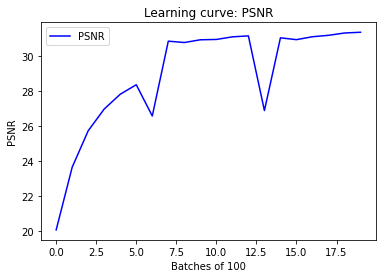

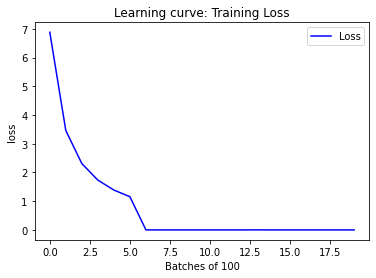

In [ ]:
import matplotlib.pyplot as plt
num_epochs = 3
epochs = np.arange(0,7 * num_epochs - 1)

plt.plot(epochs, PSNR_per_100[1:], color='b', label='PSNR')
plt.xlabel("Batches of 100")
plt.ylabel("PSNR")
plt.title("Learning curve: PSNR")
plt.legend()
plt.show()


plt.plot(epochs, loss_per_100[1:], color='b', label='Loss')
plt.xlabel("Batches of 100")
plt.ylabel("loss")
plt.title("Learning curve: Training Loss")
plt.legend()
plt.show()

In [ ]:
#@title
def pca(X, n_pc):
  n, p = X.shape
  mean = np.mean(X, axis = 0)
  centered_data = X-mean
  u, s, vh = LA.svd(centered_data, full_matrices=False)
  if n_pc < n:
    s = s[0:n_pc]
    vh = vh[0:n_pc,:]
  components = vh
  values = s
  projected = np.dot(centered_data, vh.T)
  return projected, components, values, mean, centered_data

def reconstruction(P, C, M):
  recover = np.add(np.dot(P, C),M)
  #recovered_image = recover[image_index].reshape(256, 256)
  return recover

## GAN (Generative Adversarial Network): 
The code for this part is accessible here: https://colab.research.google.com/drive/1Q4eGqNhbPOHua5T9MKfGLikptF522A3W?usp=sharing

In [ ]:
#@title
n_components = 256
recon = []
for i in range(len(high_val_gray_cp)):
  P, C, V, M, Y = pca(high_train_gray_cp[i], n_components)
  P1, C1,V1,M1, Y1 = pca(low_val_gray_cp[i], n_components)
  recovered = reconstruction(P1, C, M)
  recon.append(recovered)
reconstructed = np.array(recon)

In [ ]:
#@title
recon_rgb = np.zeros(reconstructed.shape[0]*reconstructed.shape[1]*reconstructed.shape[2]*3).reshape(reconstructed.shape[0],reconstructed.shape[1],reconstructed.shape[2], 3)
print(recon_rgb.shape)
for i in range(len(recon_rgb)):
  for j in range(recon_rgb.shape[1]):
    for k in range(recon_rgb.shape[2]):
      recon_rgb[i, j, k] = np.array([reconstructed[i,j,k],reconstructed[i,j,k], reconstructed[i,j,k]])

In [ ]:
#@title
for i in range(5):
  plt.figure(figsize=(15,15))
  plt.subplot(1,3,1)
  plt.title('High Resolution Image', fontsize = 20)
  plt.imshow(high_train_cp[i])
  plt.axis('off')
  plt.subplot(1,3,2)
  plt.title('Low Resolution Image ', fontsize = 20)
  plt.imshow(low_train_cp[i])
  plt.axis('off')
  plt.subplot(1,3,3)
  plt.title('Super Resolution Image ', fontsize = 20)
  plt.imshow(recon_rgb[i])
  plt.axis('off')
  plt.show()

In [ ]:
#@title
# inputs = layers.Input(shape = (256, 256, 3))
# l1 = conv_layer(32, (2,2))(inputs)
# l2 = conv_layer(64, (2,2))(l1)
# l3 = conv_layer(128, (2,2))(l2)
# l4 = conv_layer(256, (2,2))(l3)
# l5 = conv_layer(512, (2,2))(l4)
# l6 = transpose_layer(512, (2,2))(l5)
# l7 = transpose_layer(256, (2,2))(l6)
# l8 = transpose_layer(128, (2,2))(l7)
# l9 = transpose_layer(64, (2,2))(l8)
# l10 = transpose_layer(32, (2,2))(l9)
# outputs = layers.Conv2D(3, (2,2), padding='same')(l10)

# Gray_to_RGB = models.Model(inputs=inputs, outputs=outputs)
# Gray_to_RGB.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3), loss='mean_absolute_error',metrics=['accuracy'])
# Gray_to_RGB.summary()
# history_3 = ResNet.fit(recon_rgb, high_train_cp, batch_size=1, epochs=8)

In [ ]:
#@title
# train_history_3 = history_3.history

# epochs = np.arange(1, 9, 1)
# plt.plot(epochs, train_history_3.get('accuracy'), color='b', label='Accuracy')
# plt.xlabel("epochs")
# plt.ylabel("accuracy")
# plt.title("Learning curve: Accuracy")
# plt.legend()
# plt.show()

# plt.plot(epochs, train_history_3.get('loss'), color='b', label='Loss')
# plt.xlabel("epochs")
# plt.ylabel("loss")
# plt.title("Learning curve: Training Loss")
# plt.legend()
# plt.show()

In [ ]:
#@title
# print(Gray_to_RGB.predict(recon_rgb[i].reshape(1,256, 256,3)).shape)

In [ ]:
#@title
# for i in range(5):
#   predicted_rgb = Gray_to_RGB.predict(recon_rgb[i].reshape(1,256, 256,3))
#   plt.figure(figsize=(15,15))
#   plt.subplot(1,4,1)
#   plt.title('High Resolution Image', fontsize = 20)
#   plt.imshow(high_train_cp[i])
#   plt.axis('off')
#   plt.subplot(1,4,2)
#   plt.title('Low Resolution Image ', fontsize = 20)
#   plt.imshow(low_train_cp[i])
#   plt.axis('off')
#   plt.subplot(1,4,3)
#   plt.title('Super Resolution Image ', fontsize = 20)
#   plt.imshow(recon_rgb[i])
#   plt.axis('off')
#   plt.subplot(1,4,4)
#   plt.title('Colored Image ', fontsize = 20)
#   plt.imshow(predicted_rgb[0])
#   plt.axis('off')
#   plt.show()

# Part IV: Testing

In [ ]:
# Download testing images from Kaggle
#! kaggle datasets download -d akhileshdkapse/super-image-resolution
#! unzip super-image-resolution.zip

In [ ]:
#test_high = []
#test_high_path = '/content/data_test/HR_animal'
#test_high_files = os.listdir(test_high_path)
#test_high_files.sort(key=lambda f: int(re.sub('\D', '', f)))
#for img in tqdm(test_high_files):
#  image = Image.open(test_high_path+'/'+img)
#  image = image.getdata()
#  test_high.append(image)
#test_high = np.array(test_high)


#test_low = []
#test_low_path = '/content/data_test/LR_animal'
#test_low_files = os.listdir(test_low_path)
#test_low_files.sort(key=lambda f: int(re.sub('\D', '', f)))
#for img in tqdm(test_low_files):
#  image = Image.open(test_low_path+'/'+img)
#  image = image.getdata()
#  test_low.append(image)
#test_low = np.array(test_low)

test_high_2 = []
test_high_path_2 = '/content/data_test/HR_human'
test_high_files_2 = os.listdir(test_high_path_2)
test_high_files_2.sort(key=lambda f: int(re.sub('\D', '', f)))
for img in tqdm(test_high_files_2):
  image = Image.open(test_high_path_2+'/'+img)
  image = image.getdata()
  test_high_2.append(image)
test_high_2 = np.array(test_high_2)


test_low_2 = []
test_low_path_2 = '/content/data_test/LR_human'
test_low_files_2 = os.listdir(test_low_path_2)
test_low_files_2.sort(key=lambda f: int(re.sub('\D', '', f)))
for img in tqdm(test_low_files_2):
  image = Image.open(test_low_path_2+'/'+img)
  image = image.getdata()
  test_low_2.append(image)
test_low_2 = np.array(test_low_2)

100%|██████████| 26/26 [00:00<00:00, 320.66it/s]


In [ ]:
#test_high_cp = test_high.copy()
#test_low_cp = test_low.copy()
test_high_2_cp = test_high_2.copy()
test_low_2_cp = test_low_2.copy()

#test_high_cp = test_high_cp[:, :, :3].reshape((test_high_cp.shape[0], 256, 256,3)).astype('float32')/255.0
#test_low_cp = test_low_cp[:, :, :3].reshape((test_low_cp.shape[0], 256, 256,3)).astype('float32')/255.0
test_high_2_cp = test_high_2_cp[:, :, :3].reshape((test_high_2_cp.shape[0], 256, 256,3)).astype('float32')/255.0
test_low_2_cp = test_low_2_cp[:, :, :3].reshape((test_low_2_cp.shape[0], 256, 256,3)).astype('float32')/255.0

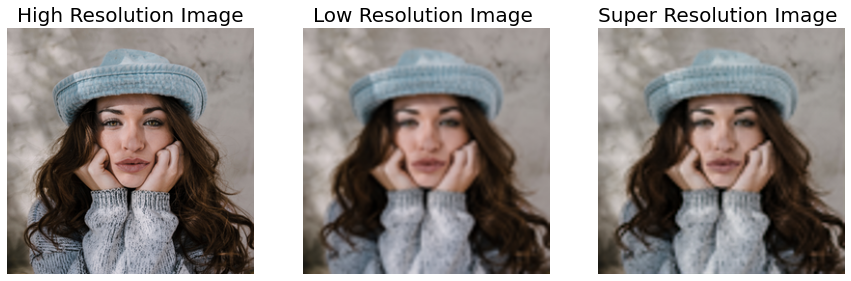

PSNR between SR image and HR image:
27.01231426554244
PSNR between LR image and HR image:
26.588753651200697


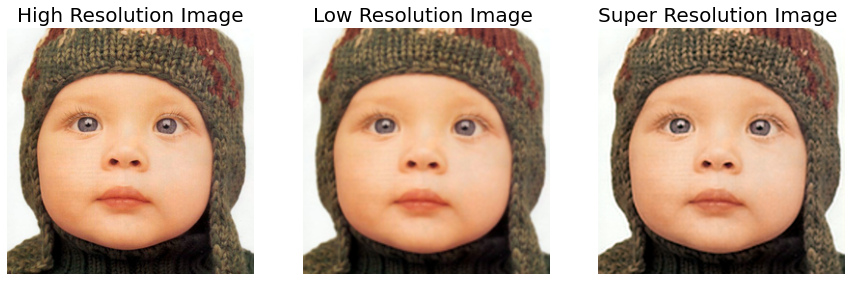

PSNR between SR image and HR image:
19.187757248335245
PSNR between LR image and HR image:
19.927400178629593


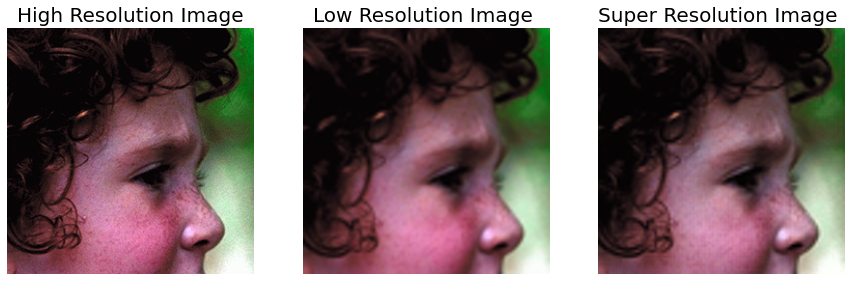

PSNR between SR image and HR image:
23.83820231457416
PSNR between LR image and HR image:
24.44675426046139


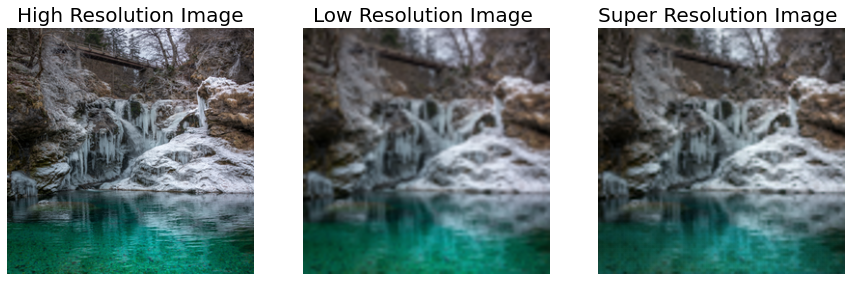

PSNR between SR image and HR image:
24.1451950736864
PSNR between LR image and HR image:
23.8539397272817


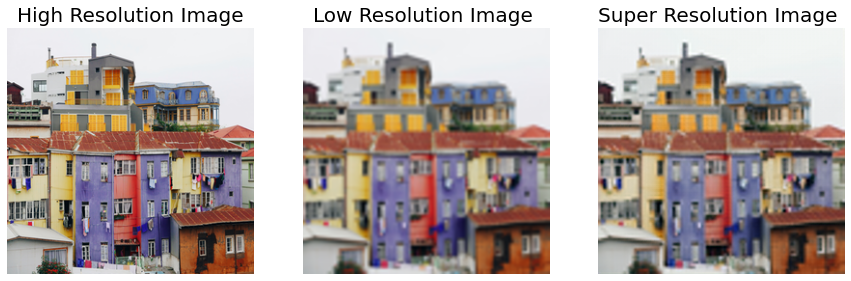

PSNR between SR image and HR image:
22.454285271018193
PSNR between LR image and HR image:
22.135674875642785


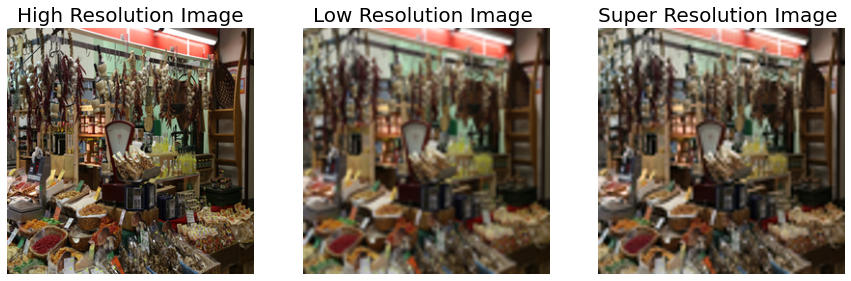

PSNR between SR image and HR image:
21.727804657344034
PSNR between LR image and HR image:
21.168510036392387


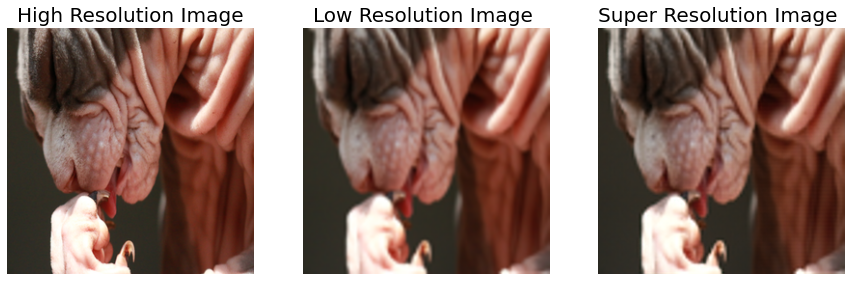

PSNR between SR image and HR image:
30.851366600454007
PSNR between LR image and HR image:
30.690409290807086


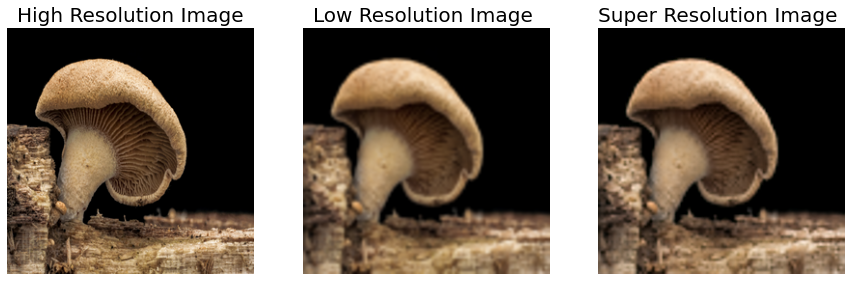

PSNR between SR image and HR image:
26.872964645566178
PSNR between LR image and HR image:
26.29226917104984


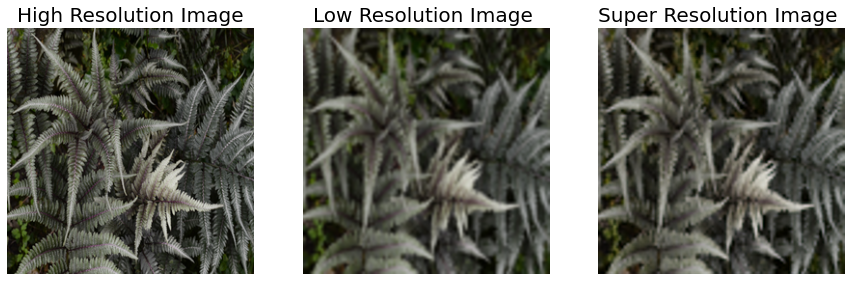

PSNR between SR image and HR image:
24.066796154319093
PSNR between LR image and HR image:
23.44456003582


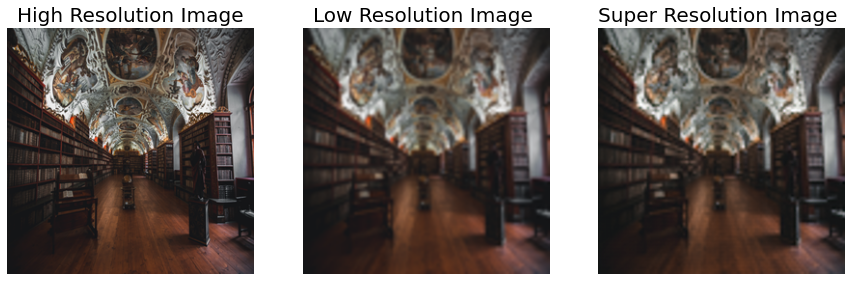

PSNR between SR image and HR image:
24.807482594962625
PSNR between LR image and HR image:
24.333382268331654


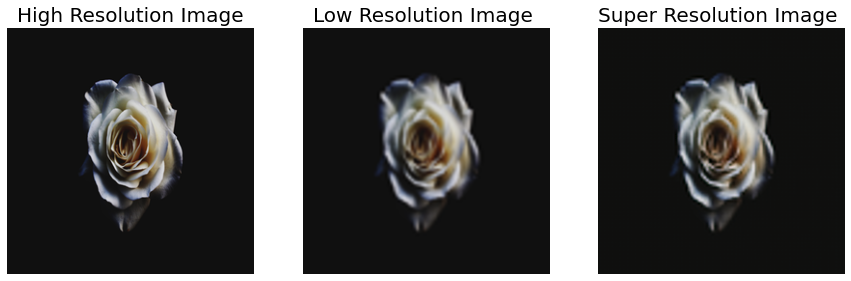

PSNR between SR image and HR image:
30.720731805995328
PSNR between LR image and HR image:
29.6958995739329


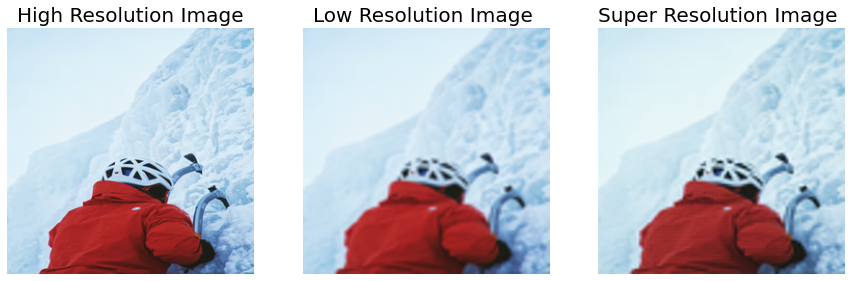

PSNR between SR image and HR image:
28.530403544614664
PSNR between LR image and HR image:
28.769672336966675


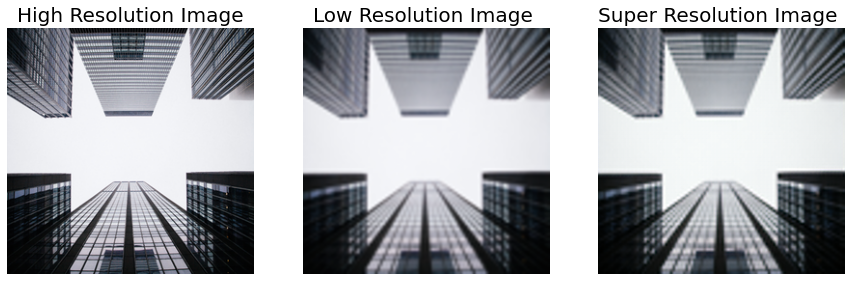

PSNR between SR image and HR image:
22.519953336144646
PSNR between LR image and HR image:
21.923983710783364


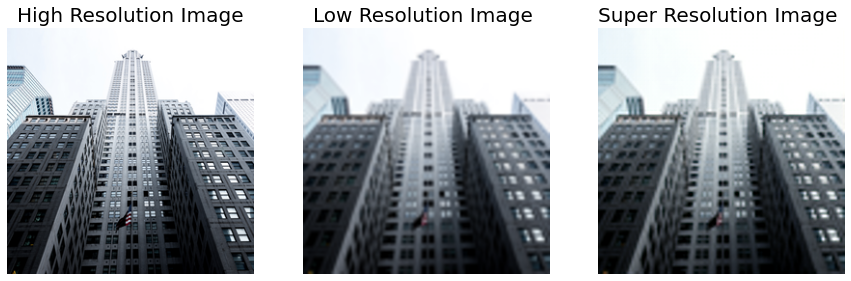

PSNR between SR image and HR image:
21.9821948720541
PSNR between LR image and HR image:
21.51932333100334


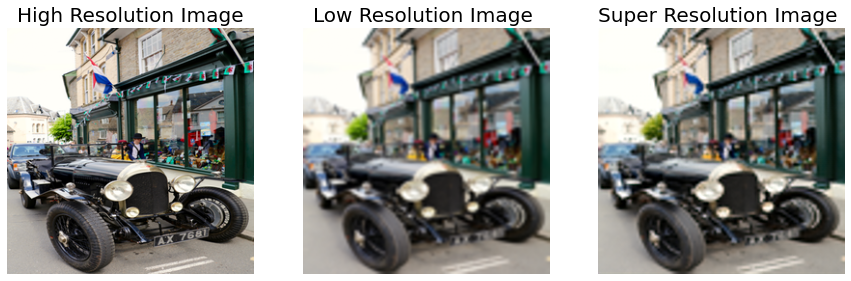

PSNR between SR image and HR image:
22.16136320554458
PSNR between LR image and HR image:
21.519316393344706


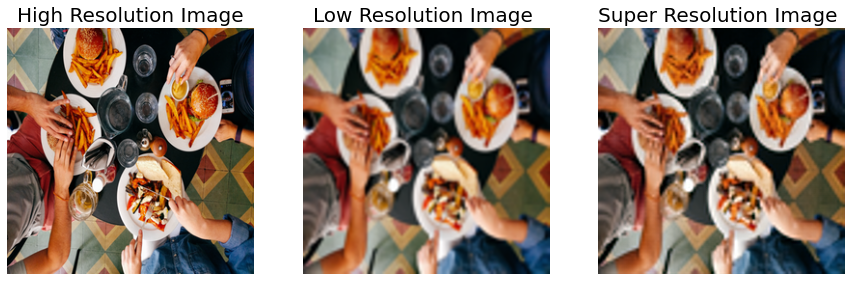

PSNR between SR image and HR image:
23.172358645589938
PSNR between LR image and HR image:
22.599659224046583


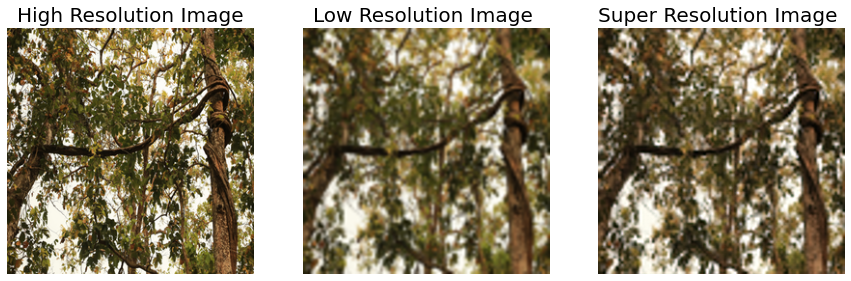

PSNR between SR image and HR image:
18.458543243632896
PSNR between LR image and HR image:
17.86645738958057


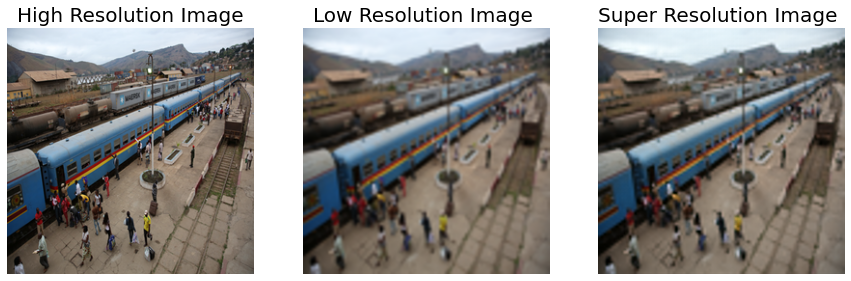

PSNR between SR image and HR image:
25.139764282053747
PSNR between LR image and HR image:
24.590303025343403


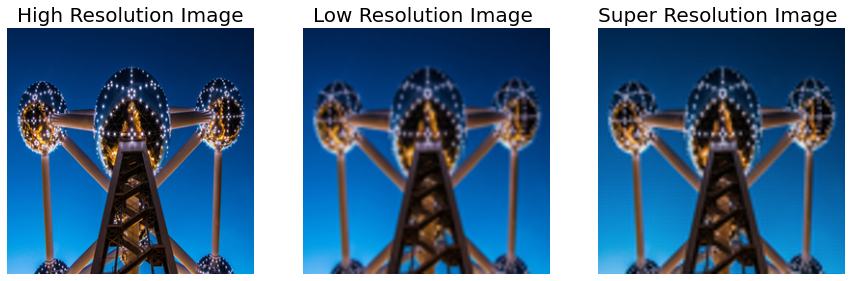

PSNR between SR image and HR image:
23.42983754430503
PSNR between LR image and HR image:
23.282360716528352


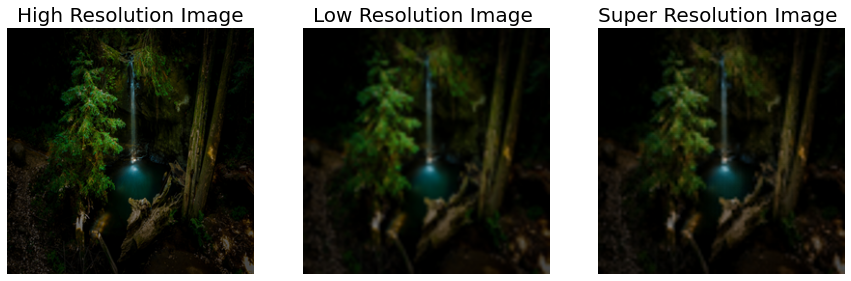

PSNR between SR image and HR image:
30.643590710498955
PSNR between LR image and HR image:
30.68216665704799


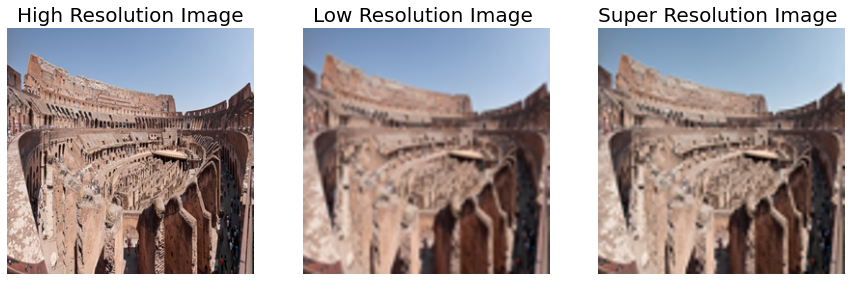

PSNR between SR image and HR image:
22.655341851830745
PSNR between LR image and HR image:
22.232805398392735


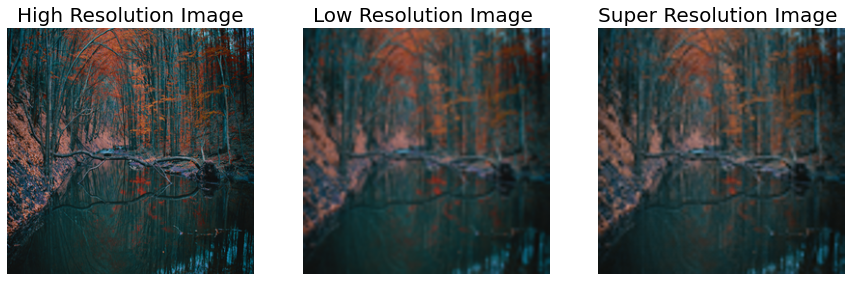

PSNR between SR image and HR image:
24.44962267500714
PSNR between LR image and HR image:
24.28546281106238


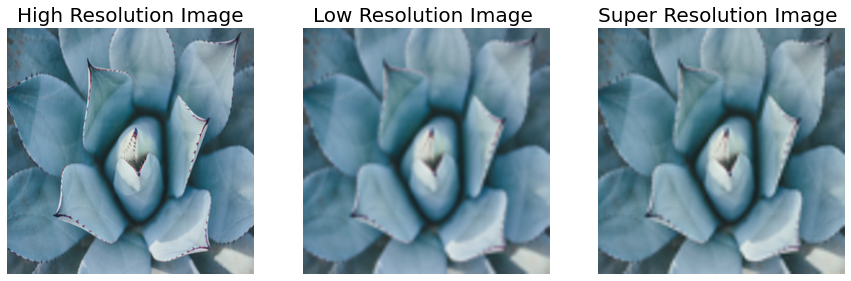

PSNR between SR image and HR image:
30.763542613785006
PSNR between LR image and HR image:
30.581048835651576


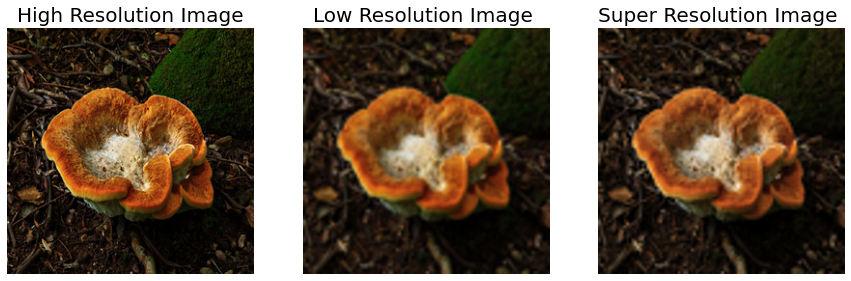

PSNR between SR image and HR image:
25.613125342642398
PSNR between LR image and HR image:
25.315115295866466


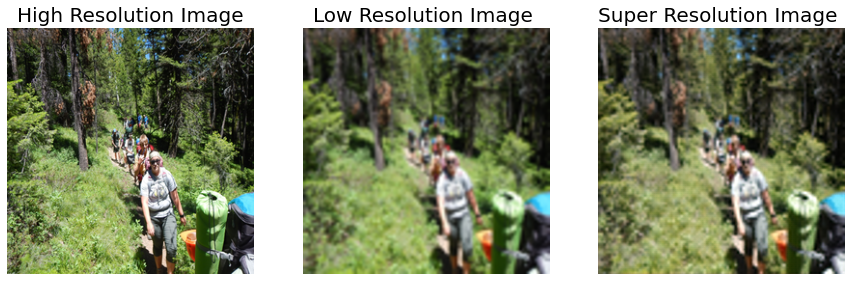

PSNR between SR image and HR image:
21.58180688081748
PSNR between LR image and HR image:
21.280304465038267


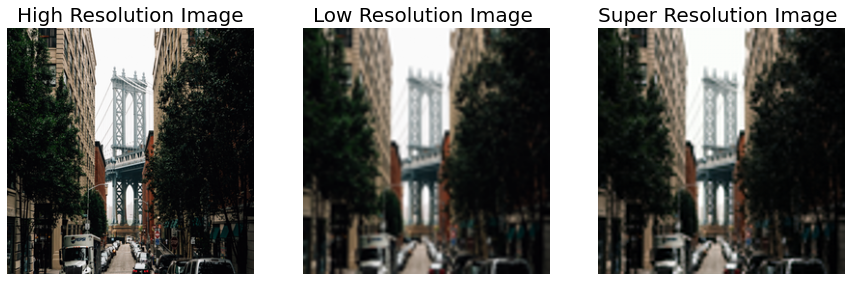

PSNR between SR image and HR image:
22.57298458558254
PSNR between LR image and HR image:
22.084843399346536


In [ ]:
for i in range(len(test_high_2_cp)):
  predicted = np.clip(ResNet.predict(test_low_2_cp[i].reshape(1,256, 256,3)),0.0,1.0).reshape(256, 256,3)
  plt.figure(figsize=(15,15))
  plt.subplot(1,3,1)
  plt.title('High Resolution Image', fontsize = 20)
  plt.imshow(test_high_2_cp[i])
  plt.axis('off')
  plt.subplot(1,3,2)
  plt.title('Low Resolution Image ', fontsize = 20)
  plt.imshow(test_low_2_cp[i])
  plt.axis('off')
  plt.subplot(1,3,3)
  plt.title('Super Resolution Image ', fontsize = 20)
  plt.imshow(predicted)
  plt.axis('off')
  plt.show()
  print("PSNR between SR image and HR image:")
  print(PSNR(test_high_2_cp[i],predicted))
  print("PSNR between LR image and HR image:")
  print(PSNR(test_high_2_cp[i],test_low_2_cp[i]))